# 0. Load parameters


In [2]:
# | tags: [parameters]
subject = "101"

In [3]:
# | tags: [parameters]
# Injected Parameters
subject = 101

In [4]:
import os
import mne
from pathlib import Path

from spectral.utils import print_date_time, read_parameters, config_project
from spectral.viz import plot_epochs
from spectral.ica import (
    compute_ica,
    label_components_ica,
    plot_ica_components,
    plot_removed_components,
)

mne.viz.set_browser_backend("matplotlib")
# mne.viz.set_browser_backend("qt")
mne.set_config("MNE_BROWSER_THEME", "light")
# matplotlib.use("Agg")


config = read_parameters()
my_paths = config_project(subject)

project_path = my_paths["project_path"]
raw_preproc_path = my_paths["raw_preproc_path"]
epochs_preproc_path = my_paths["epochs_preproc_path"]

print(epochs_preproc_path)
Path(epochs_preproc_path).mkdir(parents=True, exist_ok=True)

figures_path = my_paths["figures_path"]

print_date_time()

Using matplotlib as 2D backend.
/Users/daniel/PhD/Projects/psd-path/analysis/data/epochs/sub-101/
2024-03-25 00:19:55


This file contains preprocessing files after downsampling them.


# 2. Work with epochs


In [5]:
epochs = mne.read_epochs(
    f"{epochs_preproc_path}/sub-{subject}_drop_bad-epo.fif", preload=True
)
print(f"Sub{subject} -  working with {len(epochs)} epochs")

Reading /Users/daniel/PhD/Projects/psd-path/analysis/data/epochs/sub-101/sub-101_drop_bad-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    5000.00 ms
        0 CTF compensation matrices available


Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated
Sub101 -  working with 65 epochs


In [6]:
ica = compute_ica(epochs, n_components=0.99, method="picard")
labels, ic_labels = label_components_ica(epochs, ica)

Fitting ICA to data using 244 channels (please be patient, this may take a while)
Selecting by explained variance: 51 components
Fitting ICA took 49.1s.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/ica.py:28: RuntimeWarning: The provided Epochs instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(eeg_data, ica, method="iclabel")


/Users/daniel/.pyenv/versions/conda-paths-3.12/lib/python3.12/site-packages/spectral/ica.py:28: RuntimeWarning: The provided Epochs instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(eeg_data, ica, method="iclabel")


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
bad_prob_class [1, 2, 3, 5, 7, 11, 12, 13, 16, 17, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 32, 34, 36, 37, 38, 39, 43, 44, 45, 46, 47, 48, 49]


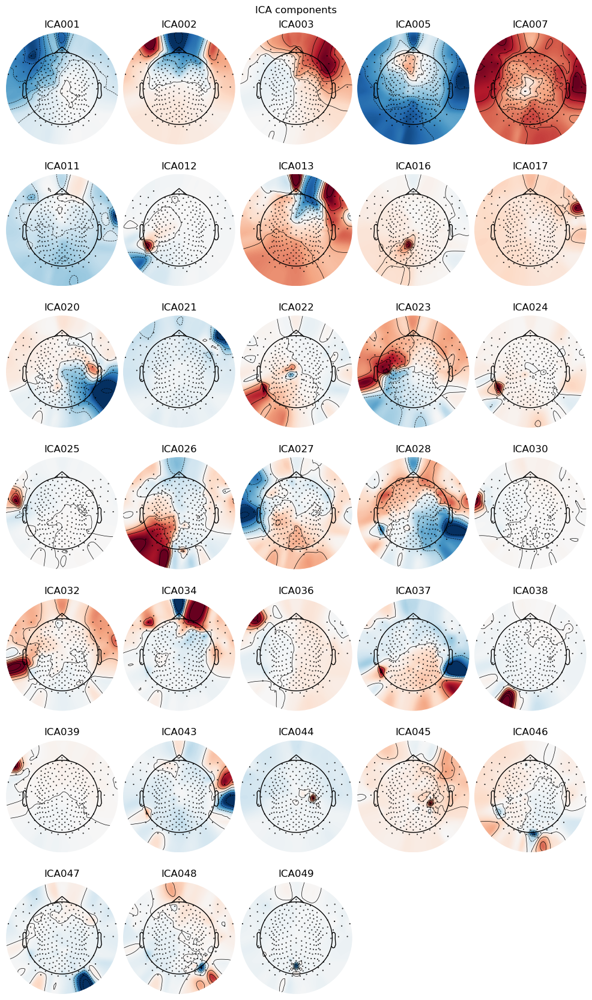

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


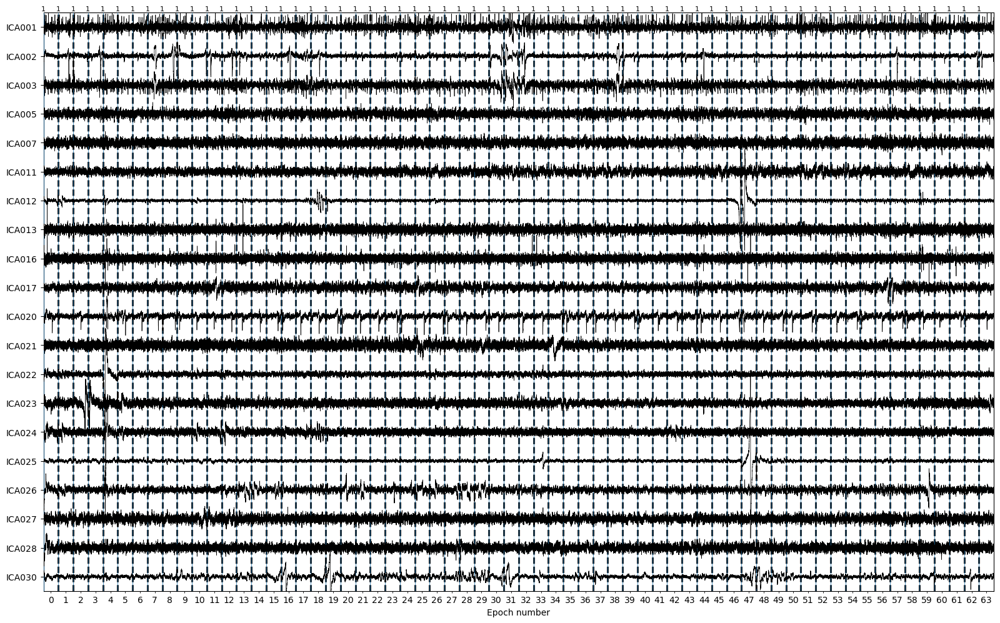

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


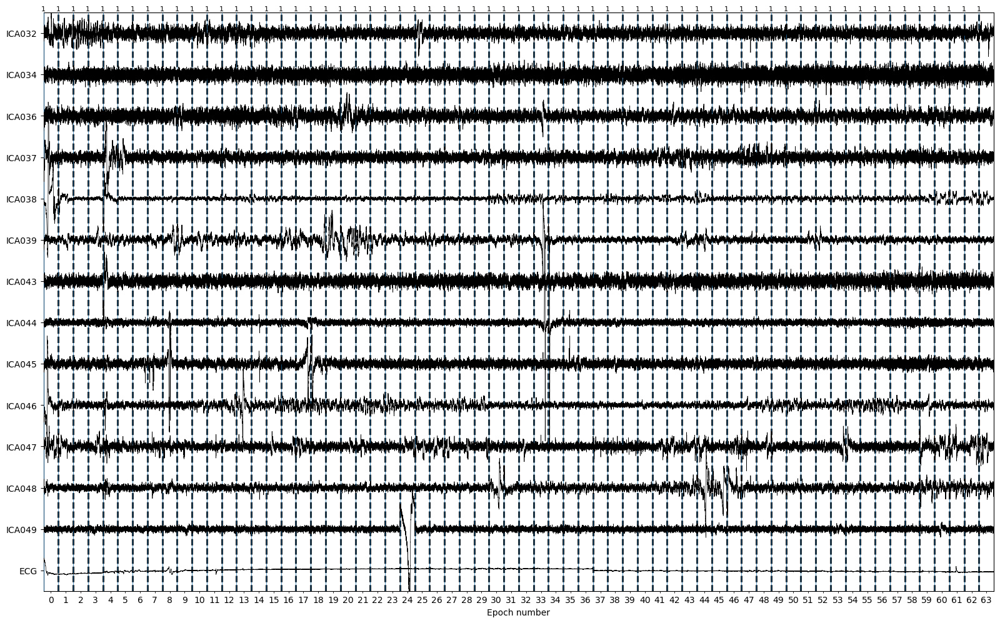

other [0, 41]


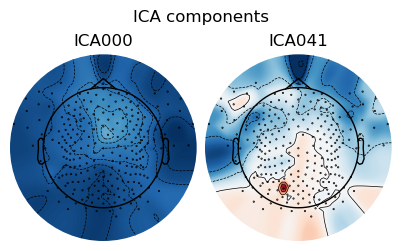

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


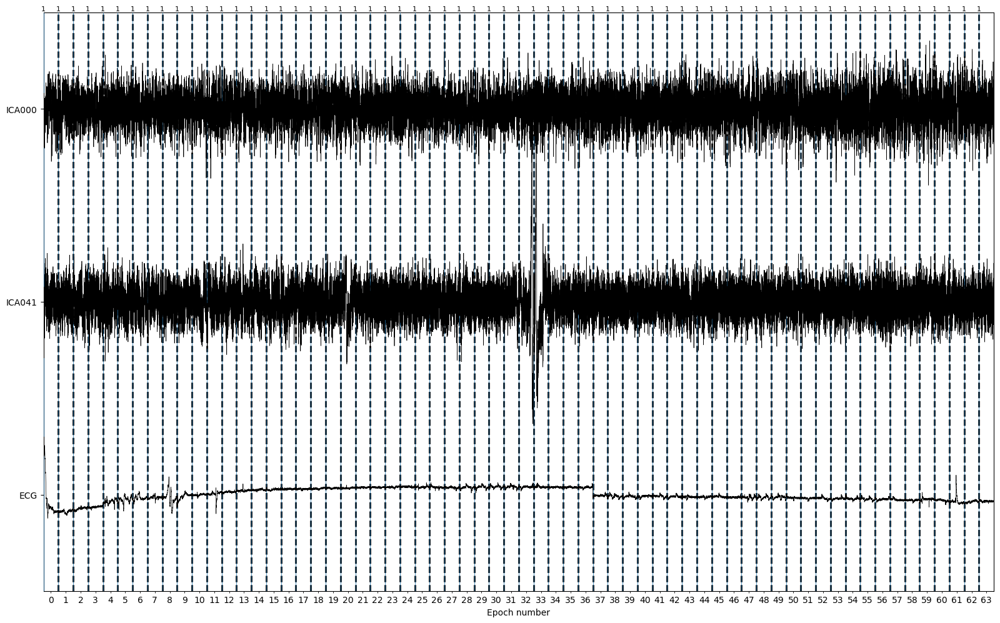

brain [4, 6, 9, 10, 14]


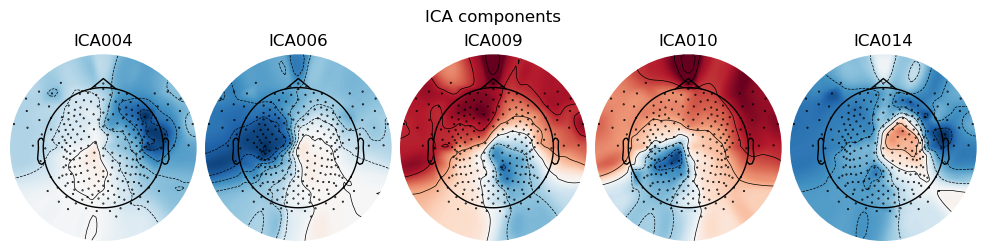

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


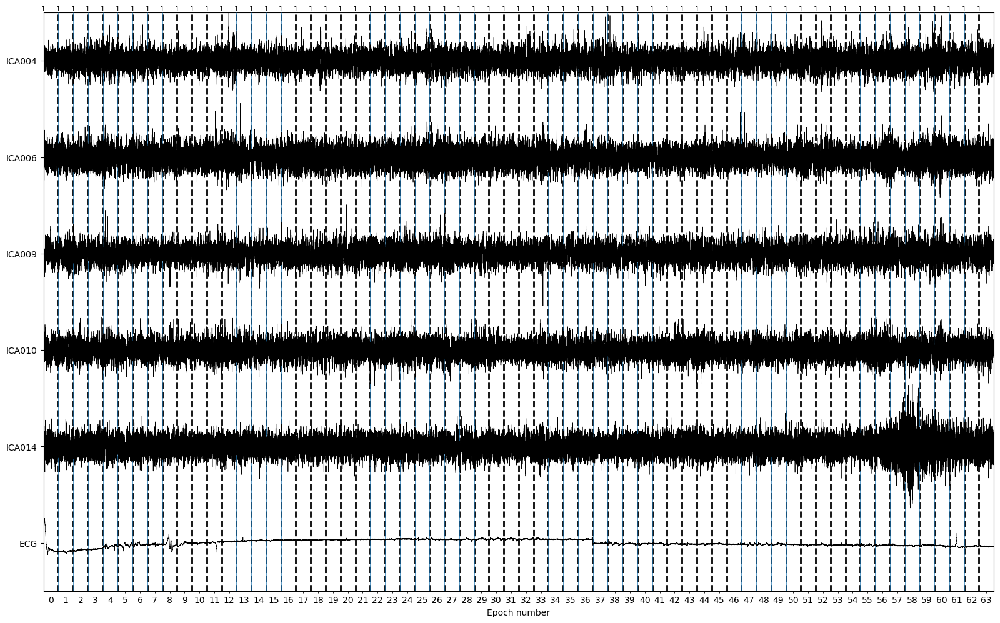

heart beat [8]


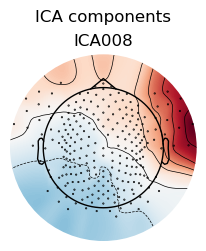

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


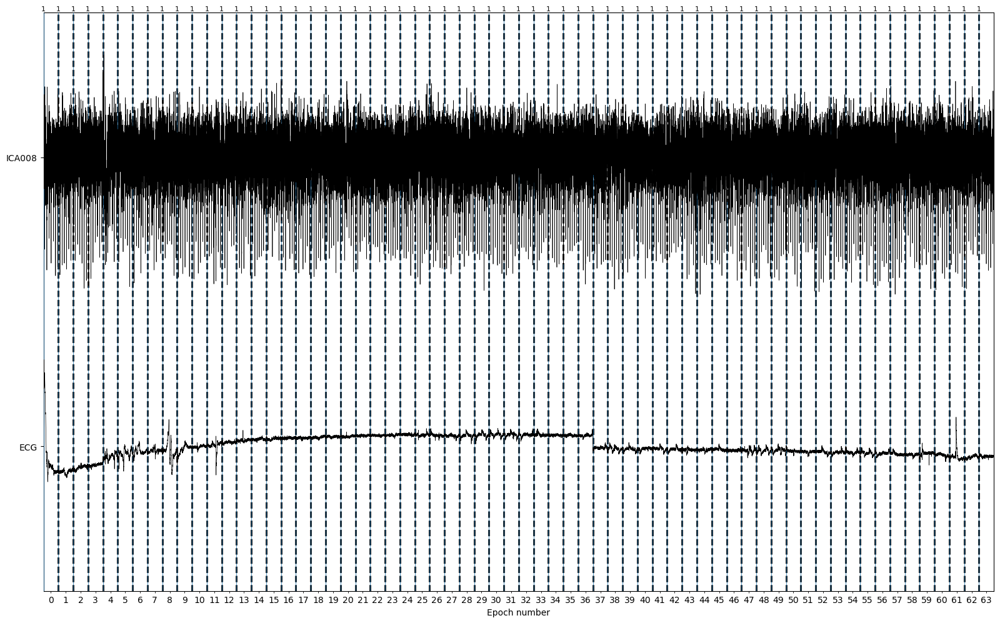

muscle artifact [15, 18, 19, 29, 31, 33, 35, 40]


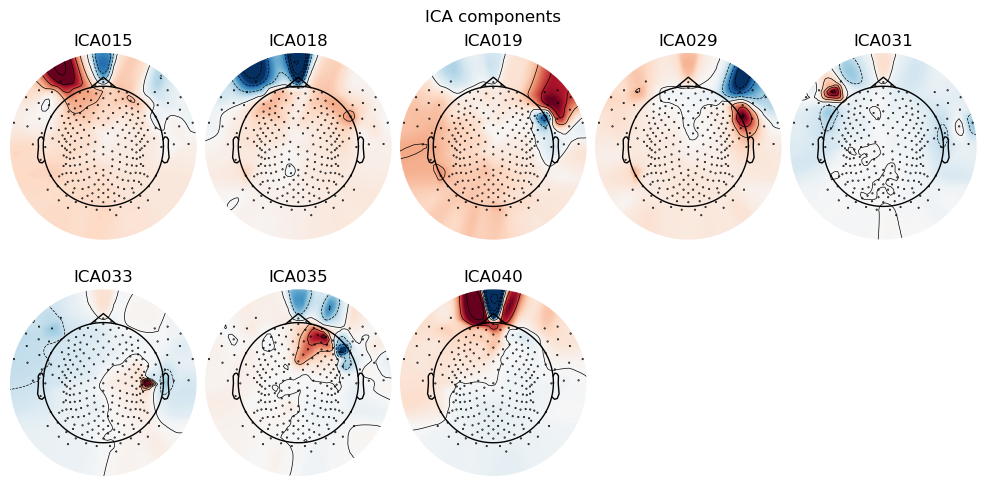

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


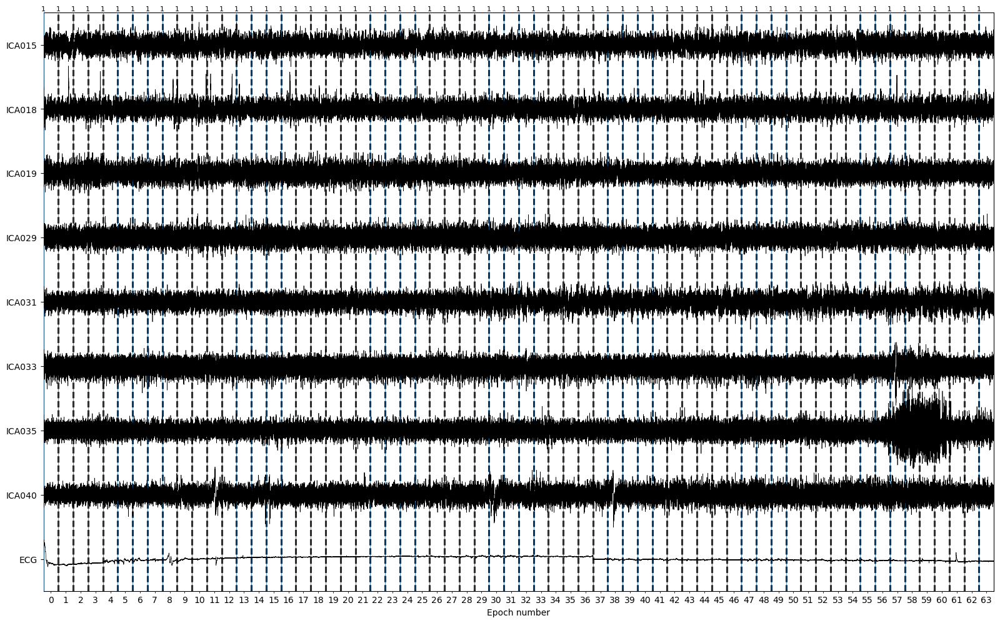

channel noise [42, 50]


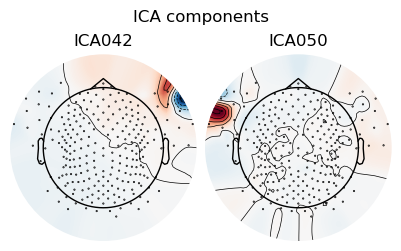

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


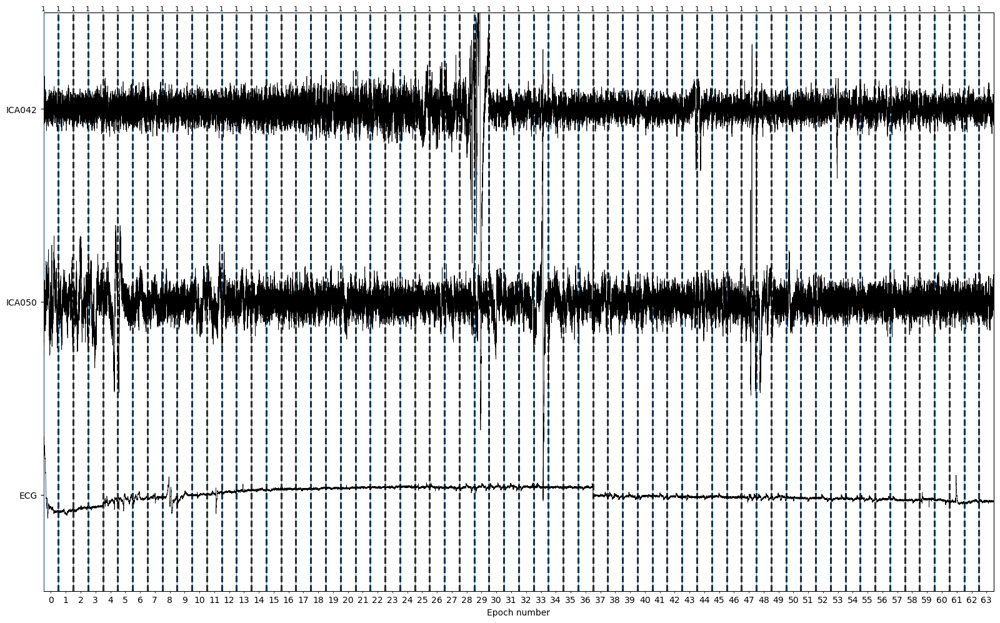

In [7]:
labeled_components = plot_ica_components(
    ica, epochs, subject=subject, figures_path=figures_path, plot_properties=False
)

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


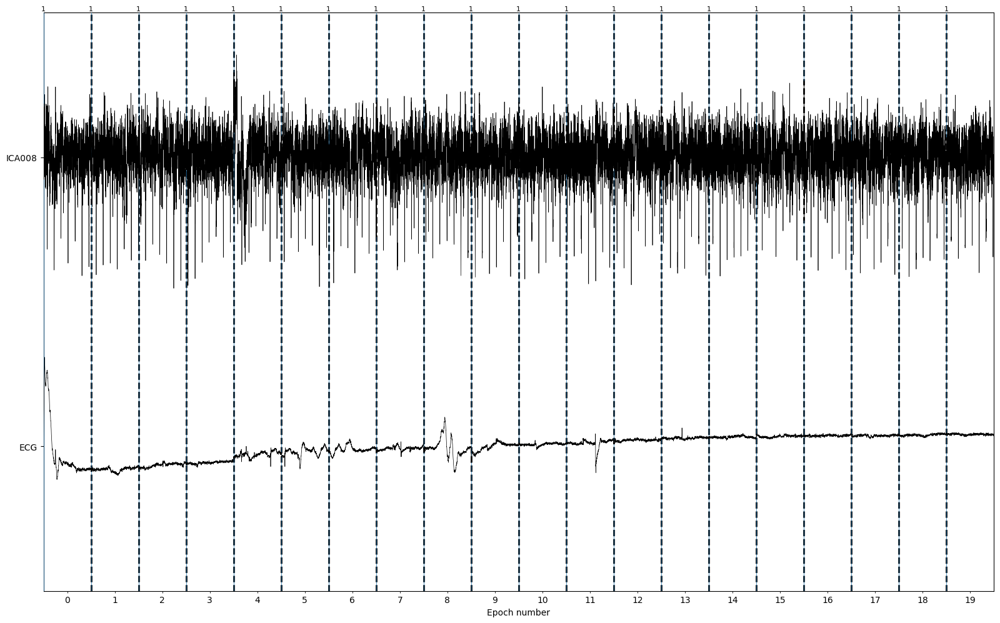

heart beat [8]
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


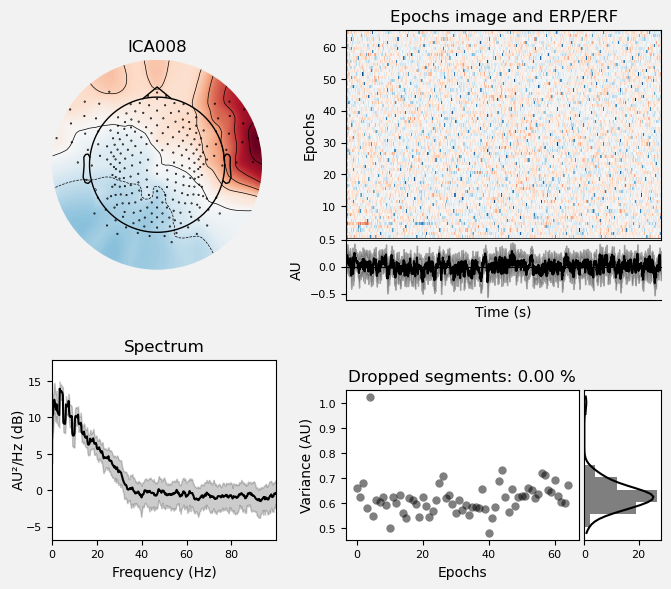

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


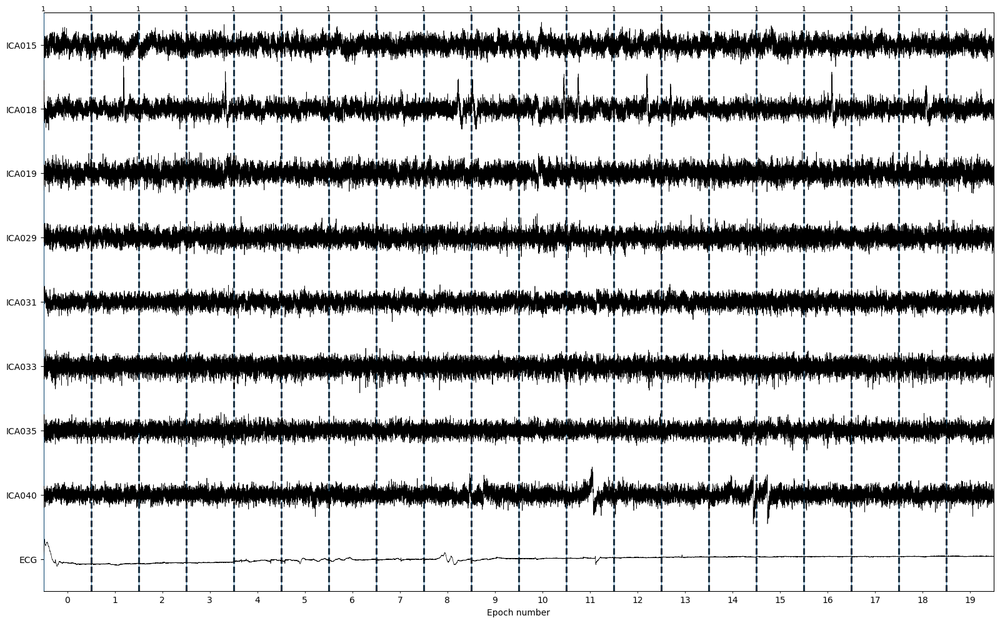

muscle artifact [15, 18, 19, 29, 31, 33, 35, 40]
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


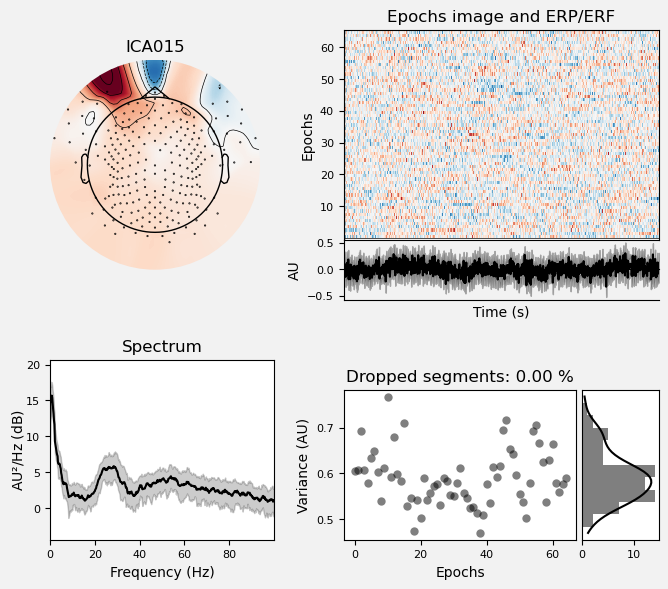

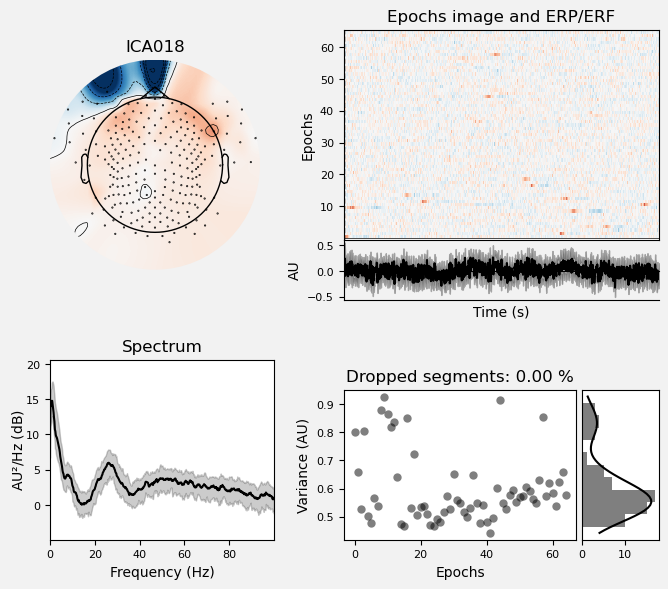

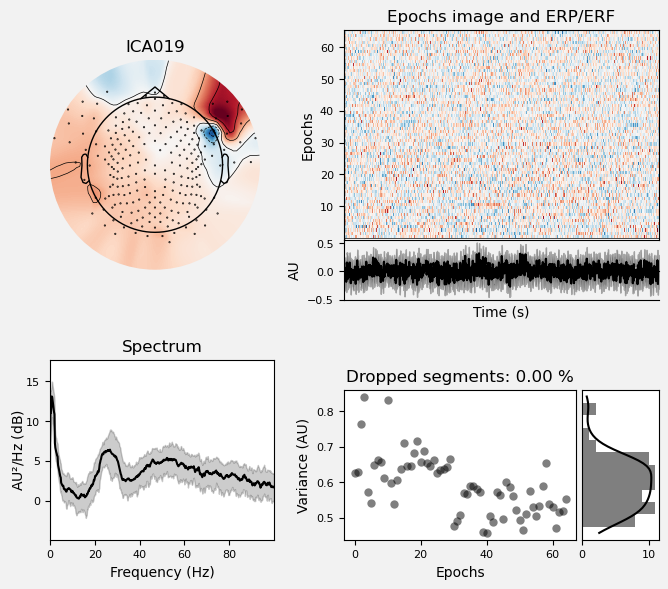

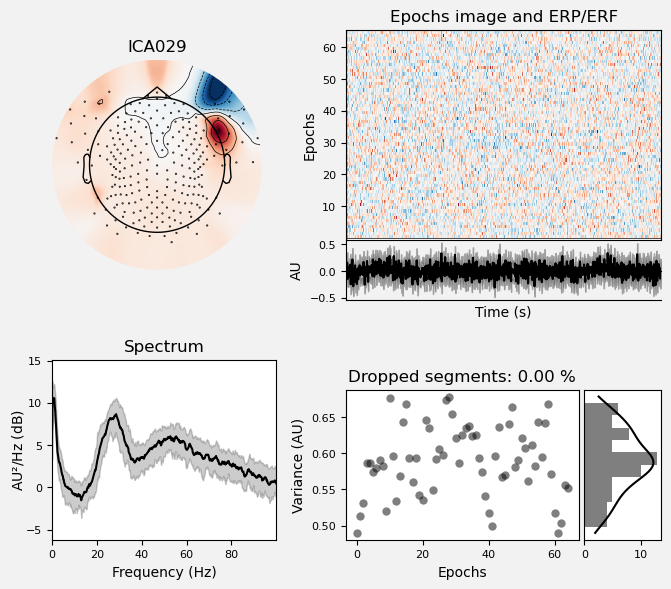

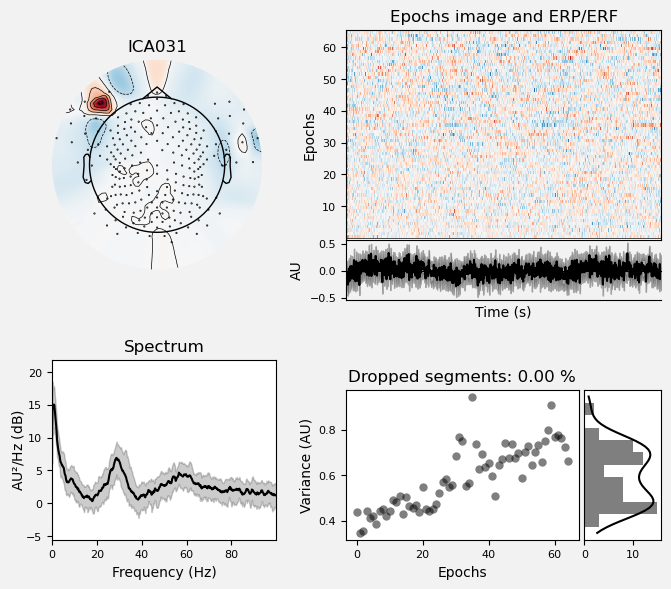

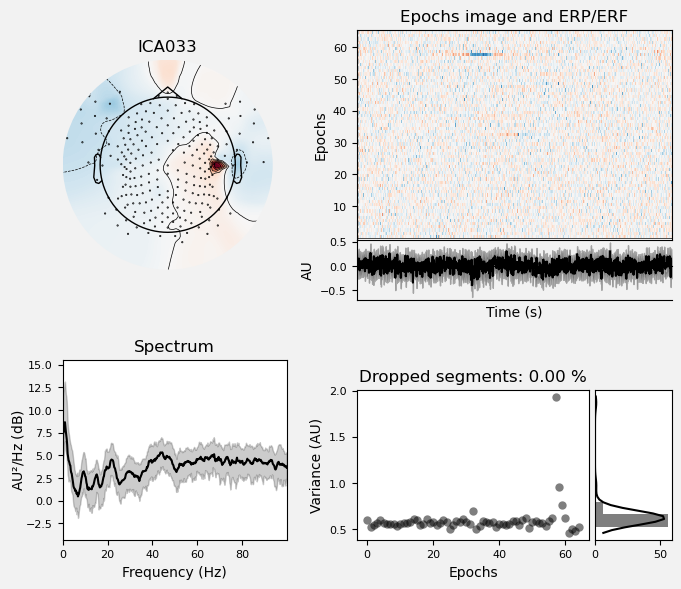

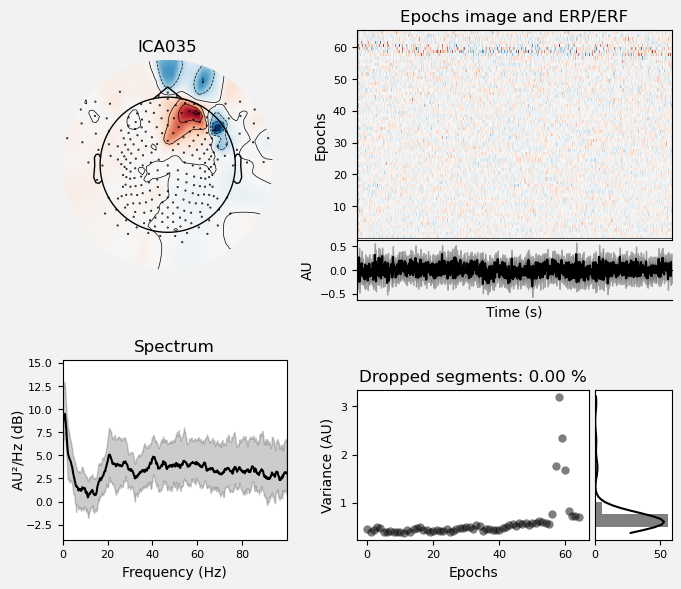

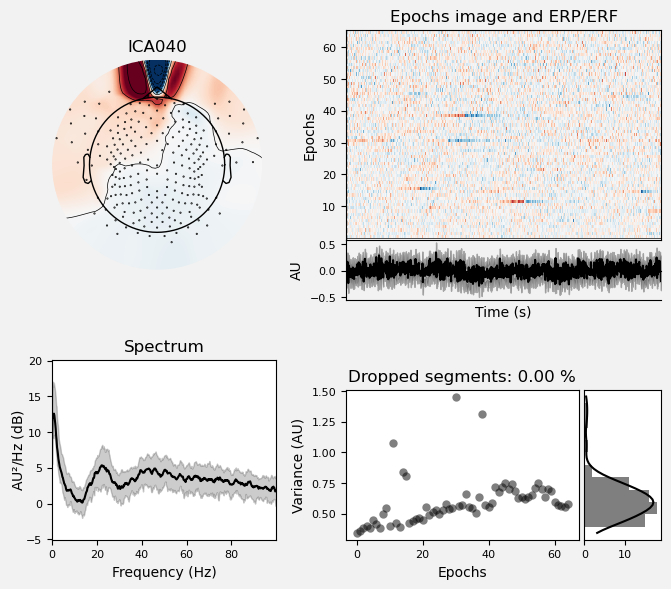

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


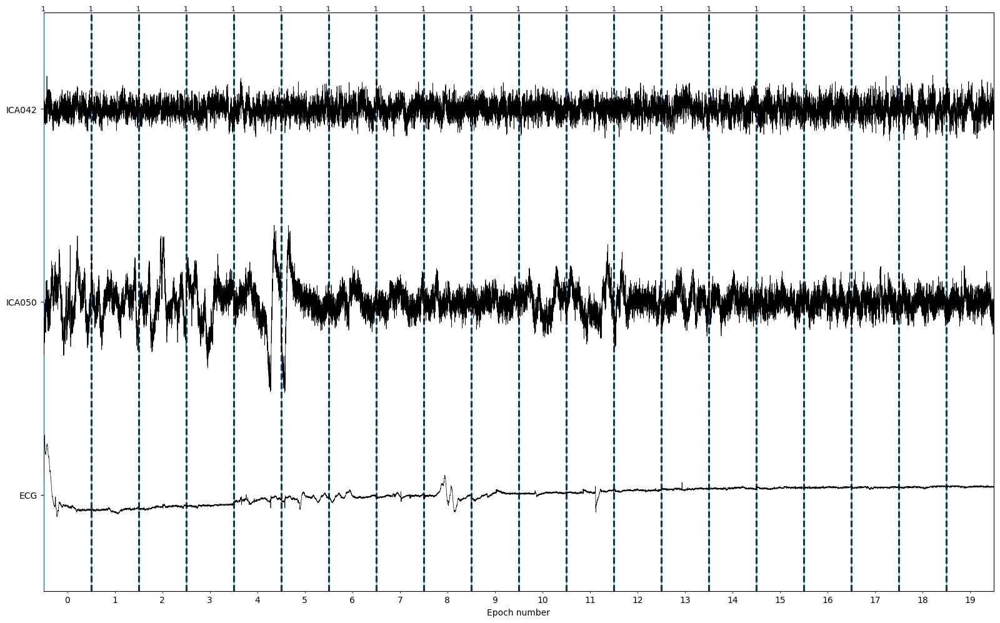

channel noise [42, 50]
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


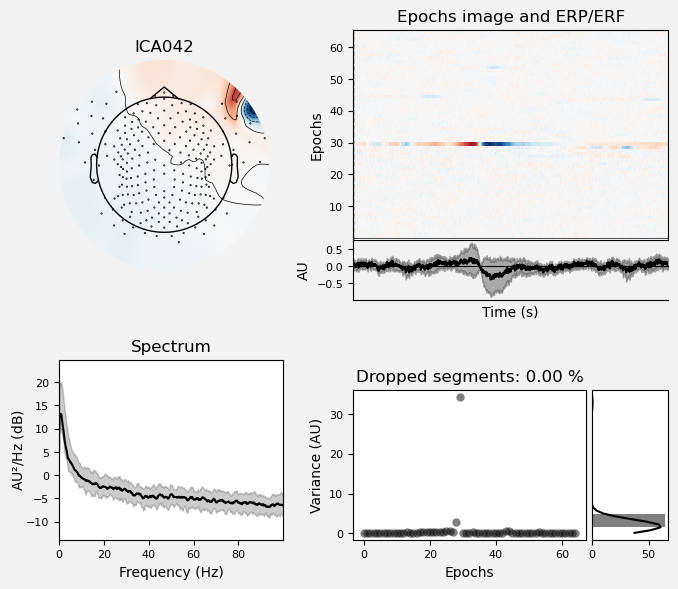

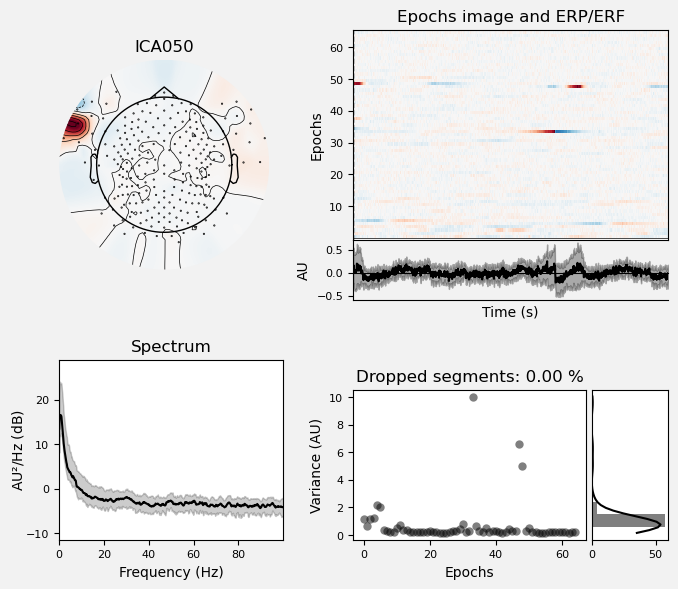

In [8]:
chosen_components = [
    "eye blink",
    "heart beat",
    "line noise",
    "muscle artifact",
    "channel noise",
]
exclude = plot_removed_components(
    ica,
    epochs,
    subject=subject,
    figure_path=figures_path,
    labeled_components=labeled_components,
    chosen_components=chosen_components,
)

Opening raw data file /Users/daniel/PhD/Projects/psd-path/analysis/data/raw/sub-101//sub-101_filtered_zap_eeg.fif...


    Range : 0 ... 150000 =      0.000 ...   300.000 secs
Ready.
Reading 0 ... 150000  =      0.000 ...   300.000 secs...
... filtering ICA sources
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 5000 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


... filtering target
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 5000 samples (10.000 s)

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


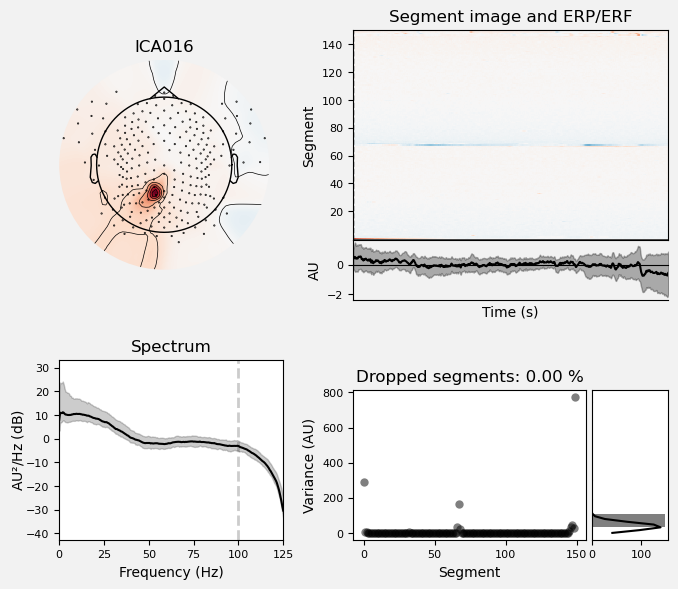

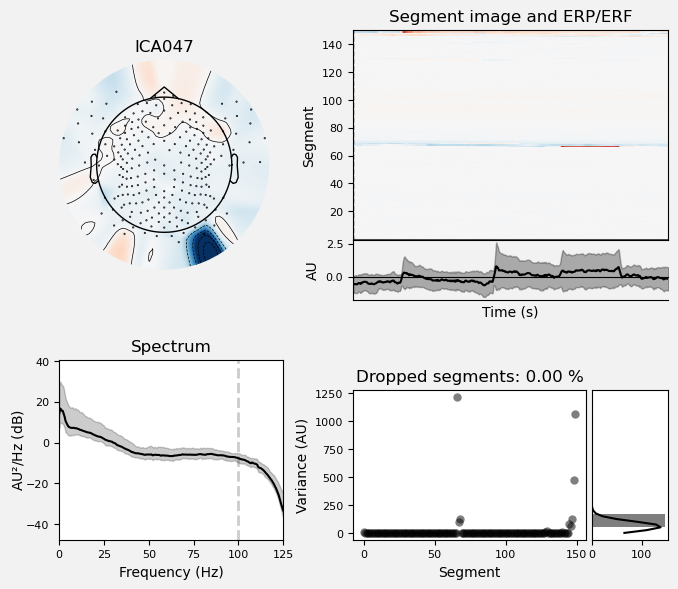

Creating RawArray with float64 data, n_channels=3, n_times=150001
    Range : 0 ... 150000 =      0.000 ...   300.000 secs
Ready.


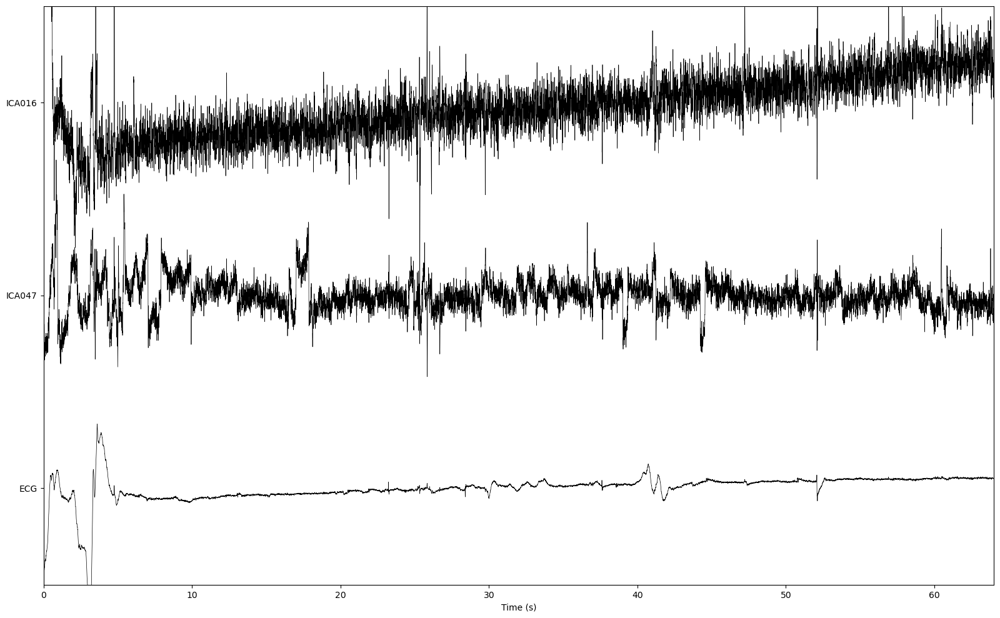

In [9]:
# ica_plot = ica.plot_sources(eeg_data)
# Exclude blink artifact components (use Fp1 as EOG proxy)
clean_raw = mne.io.read_raw_fif(
    f"{raw_preproc_path}/sub-{subject}_filtered_zap_eeg.fif", preload=True
)
# epochs_eog = mne.preprocessing.create_eog_epochs(raw=clean_raw, ch_name="EOG")
# eog_indices, eog_scores = ica.find_bads_eog(epochs_eog, ch_name="E31", threshold=2)
ecg_indices, ecg_scores = ica.find_bads_ecg(
    clean_raw, method="correlation", threshold="auto"
)
# ica.exclude = np.argwhere(abs(eog_scores) > 0.5).ravel().tolist()
if ecg_indices:
    # barplot of ICA component "EOG match" scores
    ica.plot_properties(clean_raw, picks=ecg_indices)

    # plot ICs applied to raw data, with ECG matches highlighted
    ecg_plot = ica.plot_sources(
        clean_raw,
        show_scrollbars=False,
        picks=ecg_indices,
        start=0,
        stop=len(epochs) - 1,
    )

# Automated exclusion of ICA components


Applying ICA to Epochs instance
    Transforming to ICA space (51 components)
    Zeroing out 13 ICA components
    Projecting back using 244 PCA components
No projector specified for this dataset. Please consider the method self.add_proj.


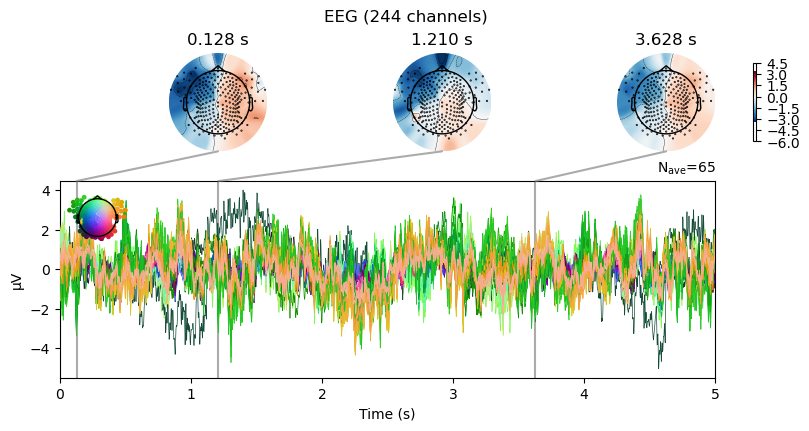

Effective window size : 4.096 (s)
Averaging across epochs...


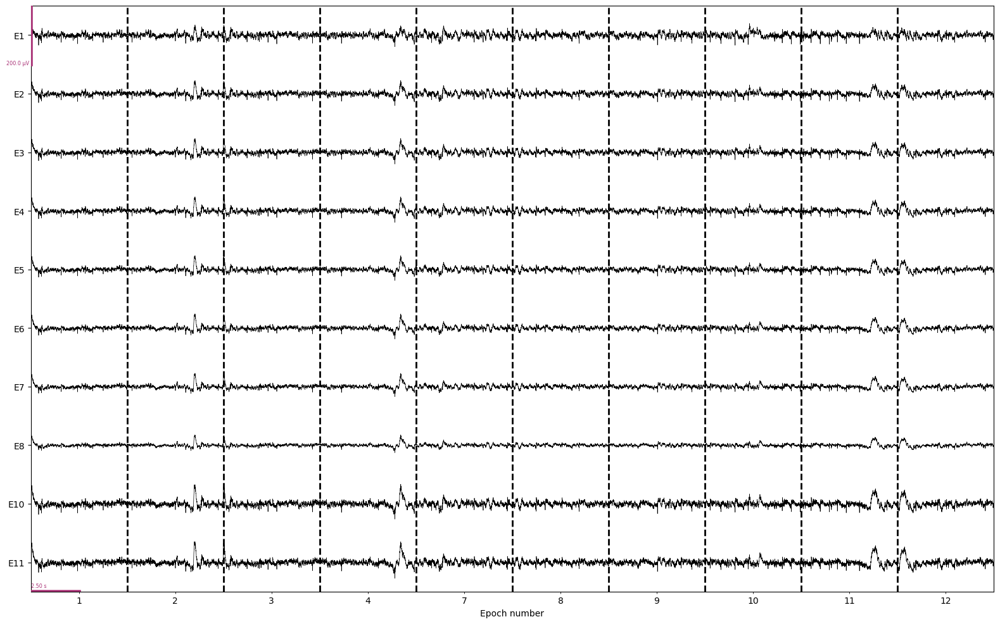

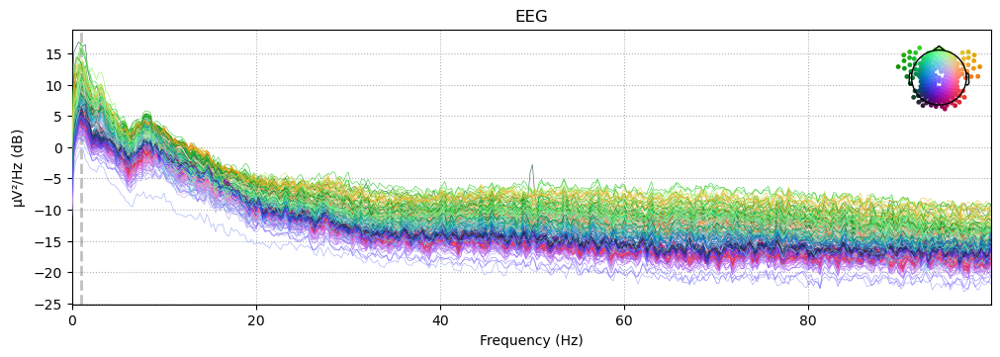

In [10]:
ica.exclude = exclude + ecg_indices
epochs_clean = ica.apply(epochs.copy(), exclude=ica.exclude)
epochs_clean.save(
    f"{epochs_preproc_path}/sub-{subject}_clean_ica-epo_automated-epo.fif",
    overwrite=True,
)
epochs_clean_plot = plot_epochs(
    epochs_clean,
    figures_path=figures_path,
    subject=subject,
    stage="epochs_after_automatic_ICA",
)

# Manually exclude more components


Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


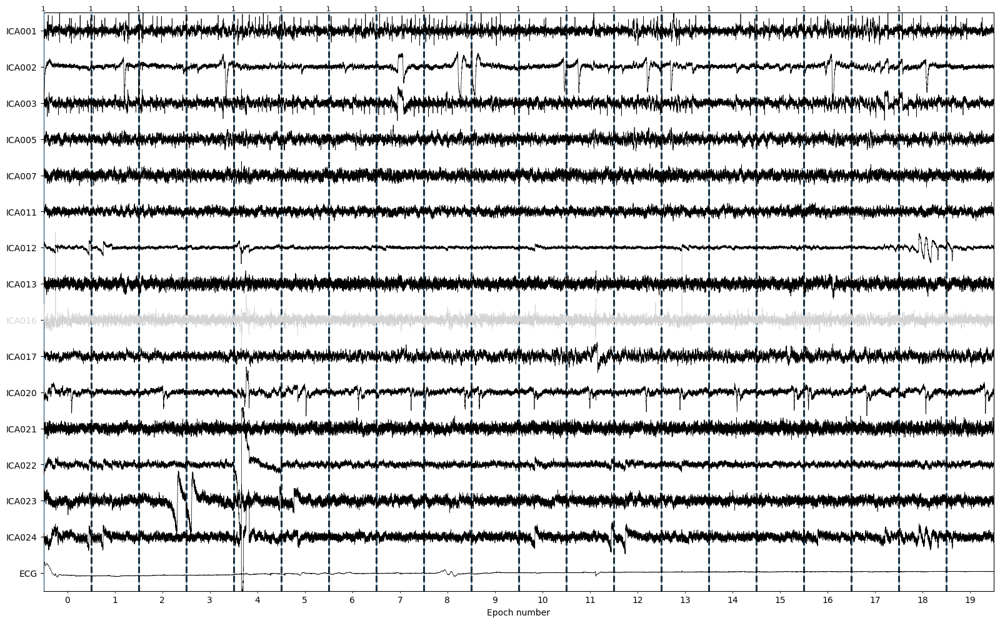

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


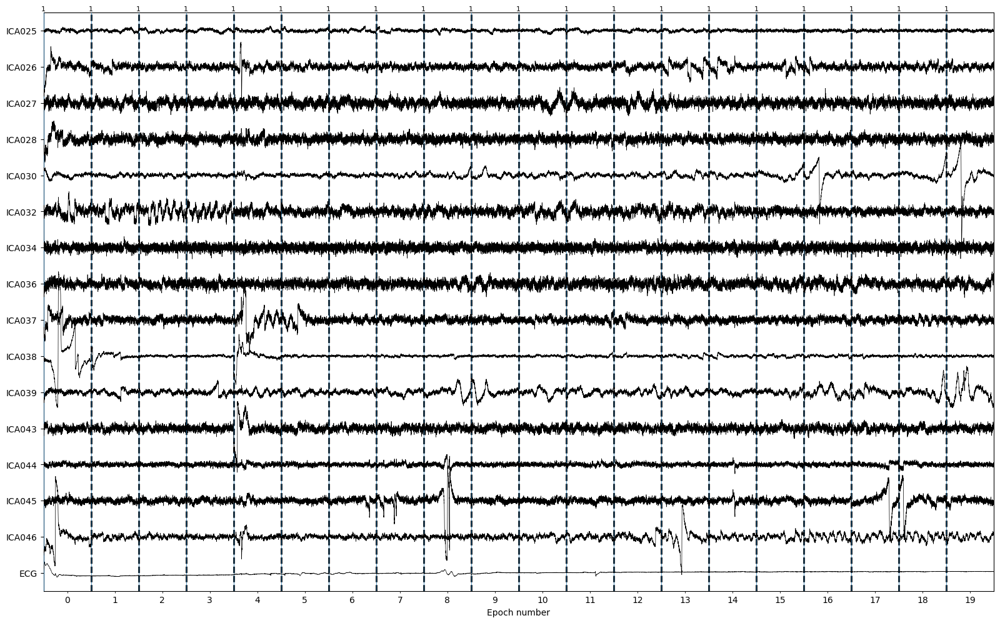

Not setting metadata
65 matching events found
No baseline correction applied
0 projection items activated


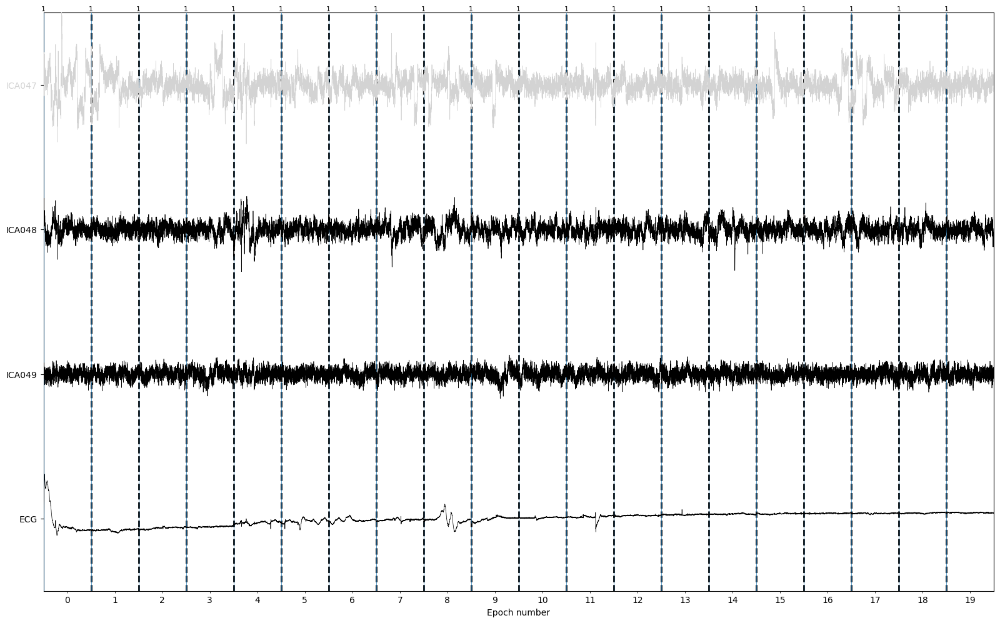

In [11]:
chunk_size = 15
indices = labeled_components["bad_prob_class"]
chunks = [indices[i: i + chunk_size]
          for i in range(0, len(indices), chunk_size)]
for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs,
        show_scrollbars=False,
        picks=chunk,
        start=0,
        stop=20,
    )
# [1, 19, 36] template should not have manual excluded be used
manual_exclude = []  # [1, 2, 3, 12, 20, 28]
if manual_exclude:
    figs = ica.plot_properties(
        epochs, picks=manual_exclude, psd_args={"fmax": 100.0})

Applying ICA to Epochs instance
    Transforming to ICA space (51 components)
    Zeroing out 13 ICA components
    Projecting back using 244 PCA components
No projector specified for this dataset. Please consider the method self.add_proj.


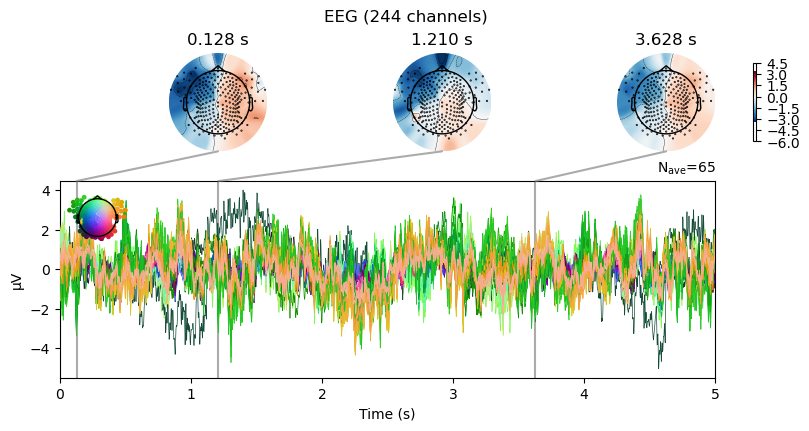

Effective window size : 4.096 (s)
Averaging across epochs...


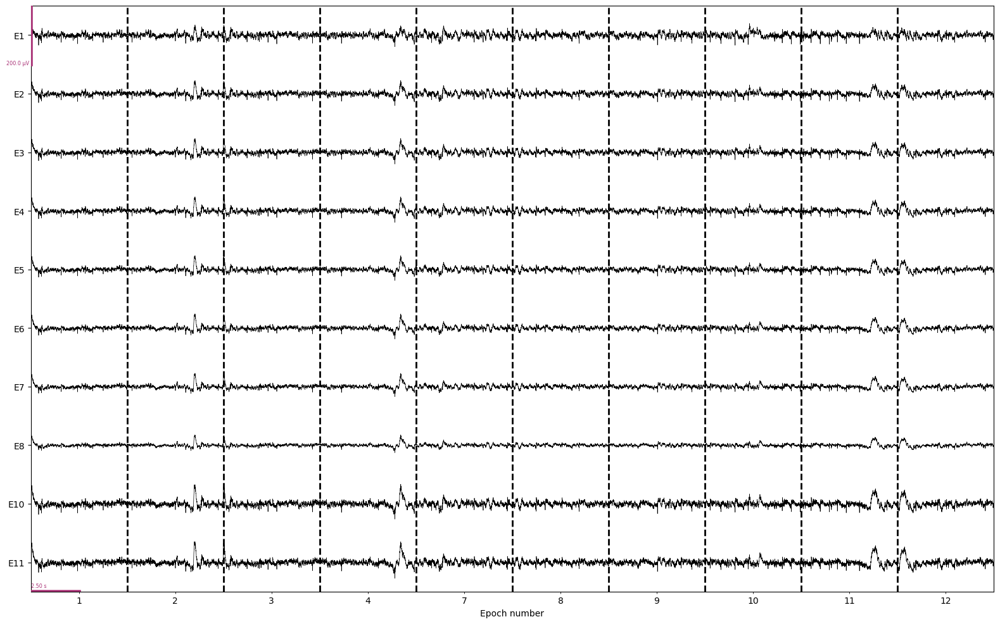

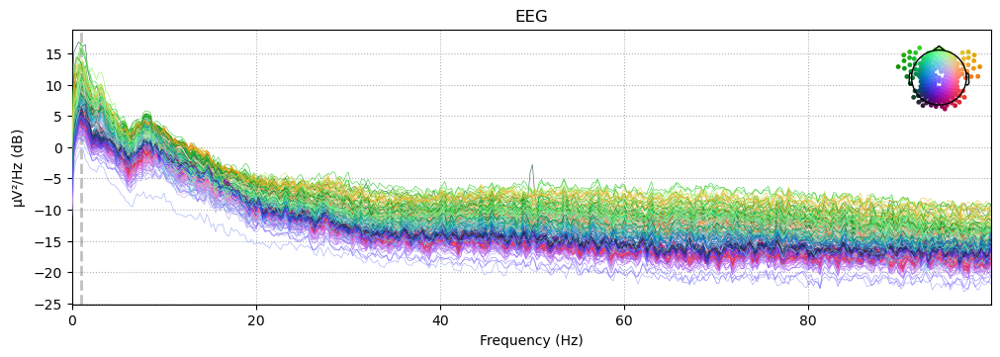

In [12]:
ica.exclude = exclude + ecg_indices + manual_exclude
epochs_clean_manual = ica.apply(epochs.copy(), exclude=ica.exclude)
epochs_clean_manual.save(
    f"{epochs_preproc_path}/sub-{subject}_clean_ica-manual-epo.fif", overwrite=True
)
epochs_clean_plot = plot_epochs(
    epochs_clean,
    figures_path=figures_path,
    subject=subject,
    stage="epochs_after_ICA_manual",
)

In [13]:
print(f"There was {len(ica.exclude)} ICA components excluded: ", ica.exclude)

There was 13 ICA components excluded:  [8, 15, 18, 19, 29, 31, 33, 35, 40, 42, 50, 16, 47]


In [14]:
# reject_log_plot = reject_log.plot_epochs(epochs[reject_log.bad_epochs], scalings=dict(eeg=1e-4))
# with mne.viz.use_browser_backend("qt"):
#    plot_bad_epochs = epochs[reject_log.bad_epochs].plot(
#        scalings=dict(eeg=1e-4))